In [59]:
import os

folder = './data/annotations/'
count = 0
# count increase by 1 in each iteration
# iterate all files from a directory
for file_name in os.listdir(folder):    
    
    count += 1
    
    # Construct old file name
    new_name = file_name.replace('_pvoc_imglab','')

    
    print(file_name,new_name)
    # Renaming the file
    os.rename(folder + file_name, folder + new_name)

print('Renamed files:', count)

100_pvoc_imglab.xml 100.xml
101_pvoc_imglab.xml 101.xml
102_pvoc_imglab.xml 102.xml
103_pvoc_imglab.xml 103.xml
104_pvoc_imglab.xml 104.xml
105_pvoc_imglab.xml 105.xml
106_pvoc_imglab.xml 106.xml
107_pvoc_imglab.xml 107.xml
108_pvoc_imglab.xml 108.xml
109_pvoc_imglab.xml 109.xml
10_pvoc_imglab.xml 10.xml
110_pvoc_imglab.xml 110.xml
111_pvoc_imglab.xml 111.xml
112_pvoc_imglab.xml 112.xml
113_pvoc_imglab.xml 113.xml
114_pvoc_imglab.xml 114.xml
115_pvoc_imglab.xml 115.xml
116_pvoc_imglab.xml 116.xml
117_pvoc_imglab.xml 117.xml
118_pvoc_imglab.xml 118.xml
119_pvoc_imglab.xml 119.xml
11_pvoc_imglab.xml 11.xml
120_pvoc_imglab.xml 120.xml
121_pvoc_imglab.xml 121.xml
122_pvoc_imglab.xml 122.xml
123_pvoc_imglab.xml 123.xml
124_pvoc_imglab.xml 124.xml
125_pvoc_imglab.xml 125.xml
126_pvoc_imglab.xml 126.xml
127_pvoc_imglab.xml 127.xml
128_pvoc_imglab.xml 128.xml
129_pvoc_imglab.xml 129.xml
12_pvoc_imglab.xml 12.xml
130_pvoc_imglab.xml 130.xml
131_pvoc_imglab.xml 131.xml
132_pvoc_imglab.xml 132.xm

1. Import required libraries and define main varaibles

In [108]:
%matplotlib inline

#import pandas as pd
import numpy as np
#import seaborn as sns
import cv2
import os
import imutils
import random
import easyocr

from glob import glob
from lxml import etree
from matplotlib import pyplot as plt

IMAGE_SIZE = 200

2. Read and resize images and save them into an array (X)

In [3]:
img_dir = "./data/images"                   # Images folder
data_path = os.path.join(img_dir,'*jpg')    # Target jpg files
files = glob(data_path)                     # Get all files in the directory (300)
files.sort()                                # Sort images by name to match them to the xml files containing the annotations of the bounding boxes

# Read files, resize images and save them into an array
X=[]
for file in files:
    img = cv2.imread(file)
    img = cv2.resize(img, (IMAGE_SIZE,IMAGE_SIZE))
    X.append(np.array(img))

3. Parsing data from XML annotations, resize them to fit the new image sizes and save them into y

In [4]:
def resizeannotation(f):    
    tree = etree.parse(f)
    for dim in tree.xpath("size"):
        width = int(dim.xpath("width")[0].text)
        height = int(dim.xpath("height")[0].text)
    for dim in tree.xpath("object/bndbox"):   
        xmin = int(float(dim.xpath("xmin")[0].text)) / (width / IMAGE_SIZE)
        ymin = int(float(dim.xpath("ymin")[0].text)) / (height / IMAGE_SIZE)
        xmax = int(float(dim.xpath("xmax")[0].text)) / (width / IMAGE_SIZE)
        ymax = int(float(dim.xpath("ymax")[0].text)) / (height / IMAGE_SIZE)
        
    return [int(xmax), int(ymax), int(xmin), int(ymin)]

In [5]:
path = './data/annotations'
text_files = ['./data/annotations/'+f for f in sorted(os.listdir(path))]

y=[]
for i in text_files:
    y.append(resizeannotation(i))

4. Verfy X and y shapes and print the first 20 images from the dataset

In [6]:
print(np.array(X).shape, np.array(y).shape)

(300, 200, 200, 3) (300, 4)


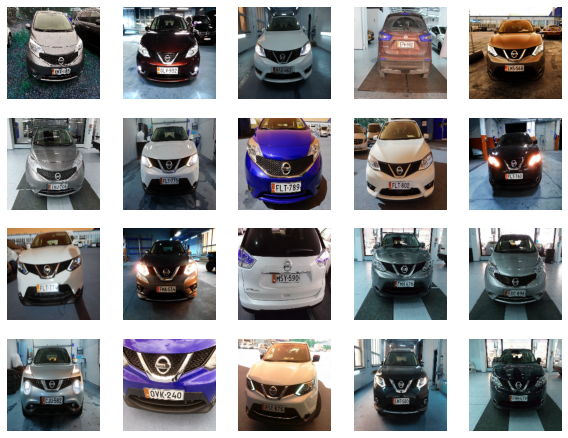

In [7]:
plt.figure(figsize=(10,20))
for i in range(0,20) :
    plt.subplot(10,5,i+1)
    plt.axis('off')
    plt.imshow(X[i])

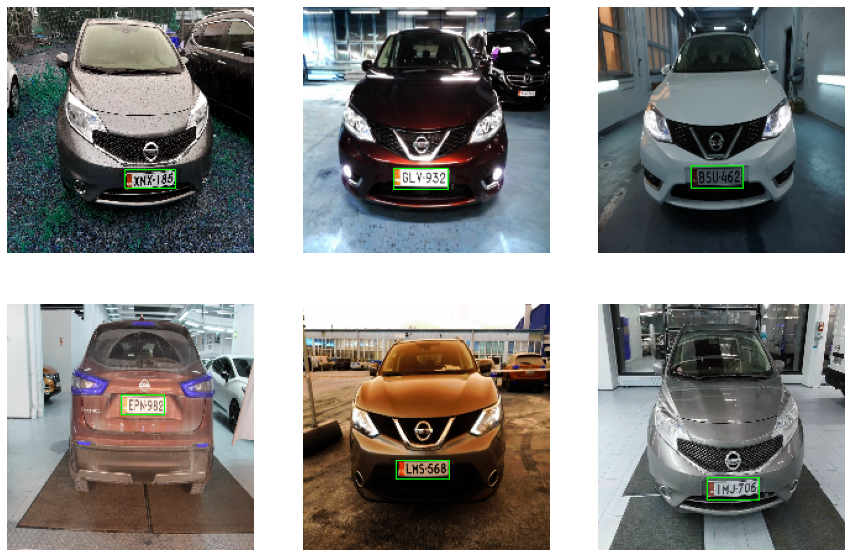

In [8]:
# Print the first 6 images including bounding boxes
plt.figure(figsize=(15,10))
for i in range(0,6) :
    plt.subplot(2,3,i+1)
    plt.axis('off')
    image = cv2.rectangle(X[i],(y[i][0],y[i][1]),(y[i][2],y[i][3]),(0, 255, 0))
    plt.imshow(image)

5. Preparing the data for the CNN

In [9]:
#Transforming in array
X=np.array(X)
y=np.array(y)

#Renormalisation
X = X / 255
y = y / 255

In [10]:
# Splitiing data into train and test sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=1)
X_train.shape,X_test.shape,y_train.shape,y_test.shape

((270, 200, 200, 3), (30, 200, 200, 3), (270, 4), (30, 4))

In [12]:
# Splitiing data into train, validations and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.1, random_state=1)
X_train.shape,X_val.shape,X_test.shape,y_train.shape,y_val.shape,y_test.shape

((216, 200, 200, 3),
 (24, 200, 200, 3),
 (60, 200, 200, 3),
 (216, 4),
 (24, 4),
 (60, 4))

6. Convolutional Neural Network (CNN)

In [13]:
from keras.models import Sequential
from keras.layers import Dense, Flatten
from keras.applications.vgg16 import VGG16

# Create the model
model = Sequential()
model.add(VGG16(weights="imagenet", include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3)))
model.add(Flatten())
model.add(Dense(128, activation="relu"))
model.add(Dense(128, activation="relu"))
model.add(Dense(64, activation="relu"))
model.add(Dense(4, activation="sigmoid"))

model.layers[-6].trainable = False

model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 6, 6, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 18432)             0         
                                                                 
 dense (Dense)               (None, 128)               2359424   
                                                                 
 dense_1 (Dense)             (None, 128)               16512     
                                                                 
 dense_2 (Dense)             (None, 64)                8256      
                                                                 
 dense_3 (Dense)             (None, 4)                 260       
                                                                 
Total params: 17,099,140
Trainable params: 2,384,452
Non

In [14]:
# Compile and train the model
model.compile(loss='mean_squared_error', optimizer='adam', metrics=['accuracy'])

from keras import callbacks
earlystopping = callbacks.EarlyStopping(monitor ="val_loss", mode ="min", patience = 5, restore_best_weights = True)
train = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=50, batch_size=32, verbose=1, callbacks =[earlystopping])

Epoch 1/50
7/7 [==============================] - 25s 3s/step - loss: 0.0684 - accuracy: 0.3194 - val_loss: 0.0431 - val_accuracy: 0.7917
Epoch 2/50
7/7 [==============================] - 21s 3s/step - loss: 0.0351 - accuracy: 0.5694 - val_loss: 0.0335 - val_accuracy: 0.8750
Epoch 3/50
7/7 [==============================] - 20s 3s/step - loss: 0.0292 - accuracy: 0.6389 - val_loss: 0.0321 - val_accuracy: 0.7500
Epoch 4/50
7/7 [==============================] - 20s 3s/step - loss: 0.0272 - accuracy: 0.6435 - val_loss: 0.0290 - val_accuracy: 0.7917
Epoch 5/50
7/7 [==============================] - 20s 3s/step - loss: 0.0249 - accuracy: 0.8657 - val_loss: 0.0254 - val_accuracy: 0.7500
Epoch 6/50
7/7 [==============================] - 20s 3s/step - loss: 0.0125 - accuracy: 0.8426 - val_loss: 0.0087 - val_accuracy: 0.7083
Epoch 7/50
7/7 [==============================] - 22s 3s/step - loss: 0.0040 - accuracy: 0.8472 - val_loss: 0.0042 - val_accuracy: 0.4167
Epoch 8/50
7/7 [==================

In [15]:
# Test the model
scores = model.evaluate(X_test, y_test, verbose=0)
print("Score : %.2f%%" % (scores[1]*100))

Score : 95.00%


7. Plot results

In [16]:
def plot_scores(train) :
    accuracy = train.history['accuracy']
    val_accuracy = train.history['val_accuracy']
    epochs = range(len(accuracy))
    plt.plot(epochs, accuracy, 'b', label='Accuracy')
    plt.plot(epochs, val_accuracy, 'r', label='Validation accuracy')
    plt.title('Scores')
    plt.legend()
    plt.show()

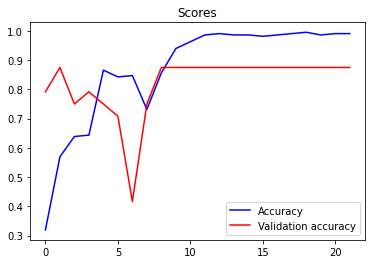

In [17]:
plot_scores(train)

8. Predict

In [18]:
 y_cnn = model.predict(X_test)

In [19]:
y_cnn.shape

(60, 4)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

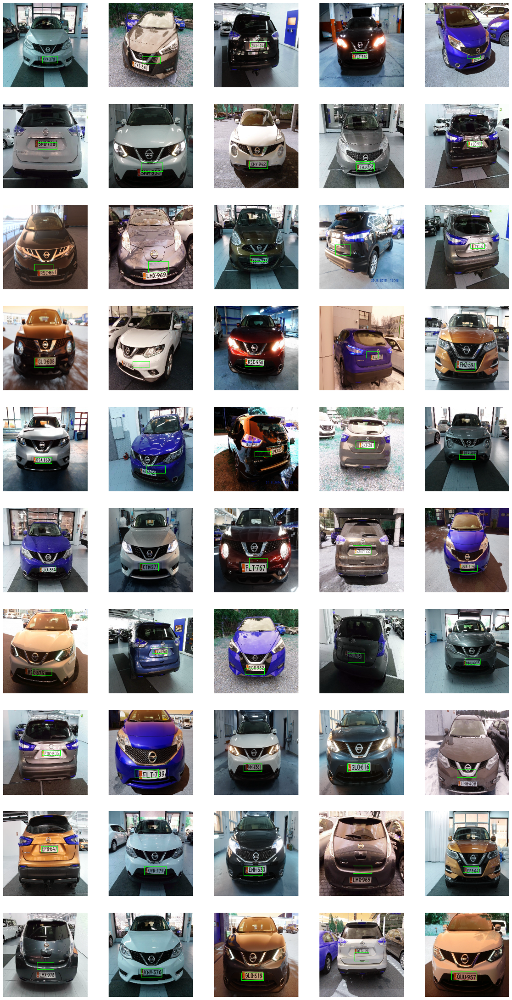

In [20]:
plt.figure(figsize=(20,40))

max = y_cnn.shape[0]
if max > 50:
    max = 50

for i in range(0,max):
    plt.subplot(10,5,i+1)
    plt.axis('off')
    ny = y_cnn[i]*255
    image = cv2.rectangle(X_test[i],(int(ny[0]),int(ny[1])),(int(ny[2]),int(ny[3])),(0, 255, 0))
    plt.imshow(image)

In [54]:
print((int(ny[0]),int(ny[1])),(int(ny[2]),int(ny[3])))

(124, 145) (91, 125)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(21, 34, 3)
91 124 125 145


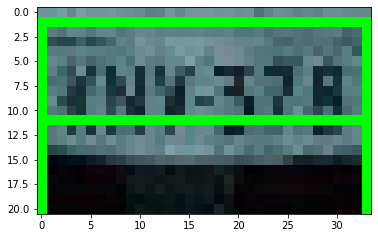

In [93]:
# (x,y) = np.where(mask==255)
# (x1, y1) = (np.min(x), np.min(y))
# (x2, y2) = (np.max(x), np.max(y))
# cropped_image = gray[x1:x2+1, y1:y2+1]

# Cropping an image
cropped_image =  X_test[0][124:145, 91:125]
#cropped_image = X_test[0][(int(ny[0]-RANGE):int(ny[1])+RAMGE):(int(ny[2]-RENGE):int(ny[3])+RANGE]
print(cropped_image.shape)
print(int(ny[2]),int(ny[0]),int(ny[3]),int(ny[1]))

plt.imshow(cropped_image)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

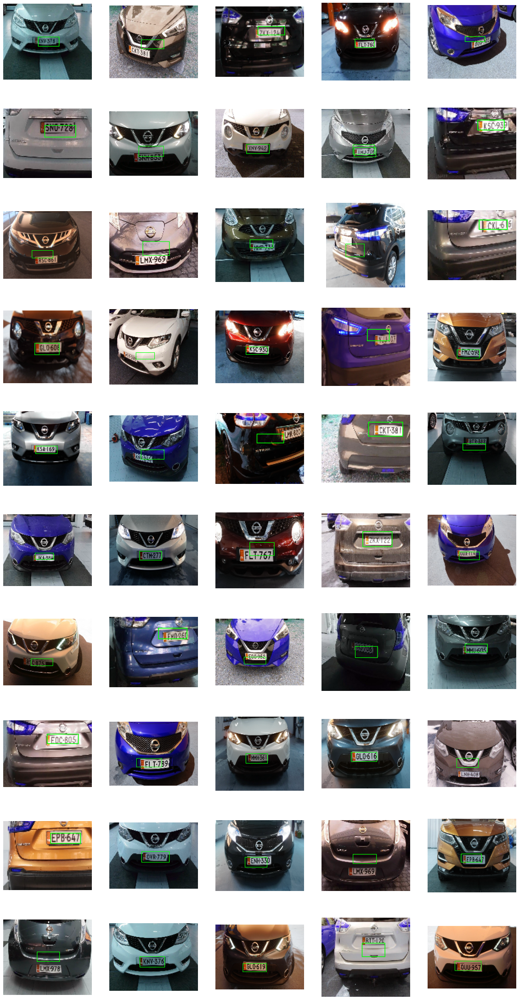

In [40]:
plt.figure(figsize=(20,40))
RANGE = 60
max = y_cnn.shape[0]
if max > 50:
    max = 50

for i in range(0,max):
    plt.subplot(10,5,i+1)
    plt.axis('off')
    ny = y_cnn[i]*255
    # cropped_image = gray[x1:x2+1, y1:y2+1]
    x1 = int(ny[0])-RANGE
    x2 = int(ny[1])+RANGE
    y1 = int(ny[2])-RANGE
    y2 = int(ny[3])+RANGE
    if x1 < 0: x1=0
    if y1 < 0: y1=0
    cropped_image = X_test[i][x1:x2,y1:y2]
    plt.imshow(cropped_image)
    image_name = str(i+1) + '.jpg'
    output_folder = './data/output/'
    
    # Create the directory if it does not exist 
    if not (os.path.exists(output_folder)):
        os.makedirs(output_folder)

    cv2.imwrite(output_folder + image_name, cropped_image*255)   

In [41]:
 y_cnn = model.predict(X)

In [42]:
y_cnn.shape

(300, 4)

In [61]:
plt.figure(figsize=(20,400))

max = y_cnn.shape[0]
RANGE = 60
for i in range(0,max):
    # Read image from original folder
    image_name = str(i+1) + '.jpg'
    output_folder = './data/output/'
    input_folder = './data/images/'
    image = cv2.imread(input_folder + image_name)
    
    # Get image shape and get the factor to convert to original annotation
    h, w, c = image.shape    
    w_ratio = w / IMAGE_SIZE
    h_ratio = h / IMAGE_SIZE

    # cropped_image = gray[x1:x2+1, y1:y2+1]
    x1 = int(ny[0])-RANGE
    x2 = int(ny[1])+RANGE
    y1 = int(ny[2])-RANGE
    y2 = int(ny[3])+RANGE
    if x1 < 0: x1=0
    if y1 < 0: y1=0    

    x1 = int(x1 * w_ratio)
    x2 = int(x2 * w_ratio)
    y1 = int(y1 * h_ratio)
    y2 = int(y2 * h_ratio)

    cropped_image = image[x1:x2,y1:y2]    

    # Create the directory if it does not exist 
    if not (os.path.exists(output_folder)):
        os.makedirs(output_folder)

    cv2.imwrite(output_folder + image_name, cropped_image)      

<Figure size 1440x28800 with 0 Axes>

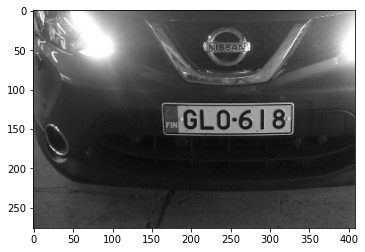

In [217]:
import random 
n = random.randint(1,300)
img = cv2.imread('./data/output/' + str(n) + '.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.imshow(cv2.cvtColor(gray, cv2.COLOR_BGR2RGB))

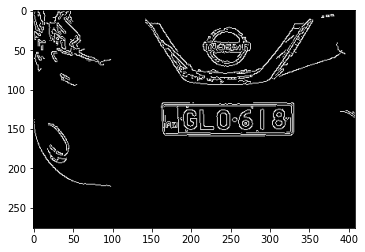

In [218]:
bfilter = cv2.bilateralFilter(gray, 13, 15, 15) #Noise reduction
edged = cv2.Canny(bfilter, 30, 200) #Edge detection
plt.imshow(cv2.cvtColor(edged, cv2.COLOR_BGR2RGB))

In [219]:
keypoints = cv2.findContours(edged.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
contours = imutils.grab_contours(keypoints)
contours = sorted(contours, key=cv2.contourArea, reverse=True)[:10]

In [155]:
for c in contours:
    # approximate the contour
    peri = cv2.arcLength(c, True)
    approx = cv2.approxPolyDP(c, 0.18 * peri, True)
    # if our approximated contour has four points, then
    # we can assume that we have found our screen
    if len(approx) == 4:
        screenCnt = approx
        break

In [156]:
screenCnt

array([[[423,  16]],

       [[397,  43]],

       [[419,  47]],

       [[408,  38]]], dtype=int32)

In [238]:
n = random.randint(1,300)
image = cv2.imread('./data/output/' + str(n) + '.jpg')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blurred = cv2.GaussianBlur(gray, (3, 3), 0)
canny = cv2.Canny(blurred, 120, 255, 1)
height, width, channel = image.shape
# Find contours
cnts = cv2.findContours(canny, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]
image_area = 4*height*width
print("Image area:", image_area)
# #Iterate thorugh contours and draw rectangles around contours
# for c in cnts:
#     x,y,w,h = cv2.boundingRect(c)
#     cv2.rectangle(image, (x, y), (x + w, y + h), (36,255,12), 2)

largest_area = 0
for c in cnts:
    x,y,w,h = cv2.boundingRect(c)
    print( x,y,w,h )
    area = 4*w*h
    if ((4*w) > h): 
      if (area < 0.08*image_area):  
            if area > largest_area:
                largest_area = area
                largest_area_contour = c    
                print(largest_area)


x,y,w,h = cv2.boundingRect(largest_area_contour)
cv2.rectangle(image, (x, y), (x + w, y + h), (36,255,12), 2)

cv2.imshow('canny', canny)
cv2.imshow('image', image)
cv2.imwrite('canny.png', canny)
cv2.imwrite('image.png', image)
cv2.waitKey(0)

Image area: 701760
476 276 30 68
8160
240 261 11 83
363 215 147 13
213 201 103 25
10300
291 146 174 44
30624
178 140 124 82
40672
176 130 334 12
108 127 70 79
366 123 144 5
179 117 101 8
298 107 22 3
327 100 104 10
370 92 1 1
365 82 5 6
317 81 9 9
360 76 5 7
309 69 28 31
393 65 3 4
355 55 47 40
298 54 4 1
240 51 223 53
47276
214 47 296 57
180 37 12 2
169 31 5 3
132 22 8 9
253 18 3 8
143 18 49 22
367 14 25 5
169 14 10 7
137 10 7 7
144 7 14 17
152 3 11 10
193 0 317 15
191 0 1 2
167 0 43 35
178 0 6 7
163 0 4 2
138 0 9 8
120 0 390 53
0 0 202 229


-1

In [183]:
screenCnt = largest_area_contour
print(screenCnt)
mask = np.zeros(gray.shape, np.uint8)
new_image = cv2.drawContours(mask, [screenCnt], 0,255, -1)
new_image = cv2.bitwise_and(image, image, mask=mask)

[[[368 128]]

 [[367 129]]

 [[365 129]]

 [[363 131]]

 [[363 133]]

 [[362 134]]

 [[363 135]]

 [[363 164]]

 [[364 165]]

 [[364 173]]

 [[365 174]]

 [[365 175]]

 [[366 175]]

 [[367 176]]

 [[410 176]]

 [[411 177]]

 [[420 177]]

 [[421 176]]

 [[422 176]]

 [[423 177]]

 [[483 177]]

 [[484 176]]

 [[554 176]]

 [[555 175]]

 [[557 175]]

 [[559 173]]

 [[559 166]]

 [[560 165]]

 [[560 148]]

 [[561 147]]

 [[561 130]]

 [[560 129]]

 [[558 129]]

 [[557 128]]

 [[529 128]]

 [[557 128]]

 [[558 129]]

 [[559 129]]

 [[561 131]]

 [[561 147]]

 [[560 148]]

 [[560 165]]

 [[559 166]]

 [[559 172]]

 [[556 175]]

 [[555 175]]

 [[554 176]]

 [[484 176]]

 [[483 177]]

 [[423 177]]

 [[422 176]]

 [[421 176]]

 [[420 177]]

 [[411 177]]

 [[410 176]]

 [[367 176]]

 [[365 174]]

 [[365 173]]

 [[364 172]]

 [[364 165]]

 [[363 164]]

 [[363 135]]

 [[362 134]]

 [[363 133]]

 [[363 132]]

 [[366 129]]

 [[367 129]]

 [[368 128]]

 [[397 128]]

 [[398 129]]

 [[399 129]]

 [[398

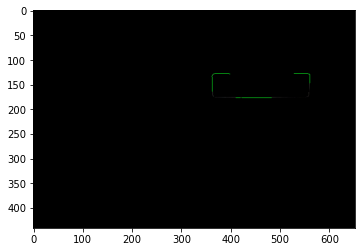

In [184]:
plt.imshow(cv2.cvtColor(new_image, cv2.COLOR_BGR2RGB))

In [185]:
(x,y) = np.where(mask==255)
(x1, y1) = (np.min(x), np.min(y))
(x2, y2) = (np.max(x), np.max(y))
cropped_image = gray[x1:x2+1, y1:y2+1]

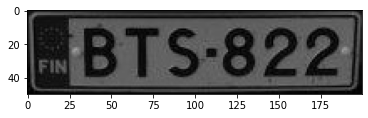

In [186]:
plt.imshow(cv2.cvtColor(cropped_image, cv2.COLOR_BGR2RGB))

In [109]:
reader = easyocr.Reader(['en'])
result = reader.readtext(cropped_image)
result

CUDA not available - defaulting to CPU. Note: This module is much faster with a GPU.


[([[3, 1], [161, 1], [161, 44], [3, 44]], 'GLR277', 0.9536456613683191)]

In [110]:
for r in result:
    print(np.sum(np.subtract(r[0][1], r[0][0])))

158


In [111]:
region_threshold = 0.6

In [112]:
def filter_text(region, ocr_result, region_threshold):
    rectangle_size = region.shape[0]*region.shape[1]

    plate = []

    for result in ocr_result:
        length = np.sum(np.subtract(result[0][1], result[0][0]))
        height = np.sum(np.subtract(result[0][2], result[0][1]))

        if length*height / rectangle_size > region_threshold:
            plate.append(result[1])
    return plate

In [113]:
plate = filter_text(cropped_image, result, region_threshold)

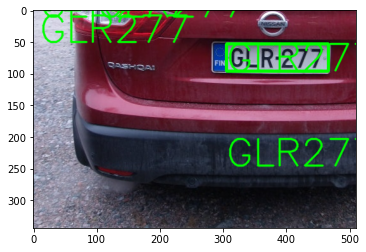

In [120]:
text = plate[0]
font = cv2.FONT_HERSHEY_SIMPLEX
res = cv2.putText(img, text=text, org=(10, 50), fontFace=font, fontScale=2, color=(0,255,0), thickness=2, lineType=cv2.LINE_AA)
res = cv2.rectangle(img, tuple(approx[0][0]), tuple(approx[2][0]), (0,255,0),3)
plt.imshow(cv2.cvtColor(res, cv2.COLOR_BGR2RGB))